In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [2]:
dfg = pd.read_csv('Data.csv')
dfe = dfg[dfg['genre'] != 'Classical']
df = dfg[dfg['genre'] == 'Classical']

In [3]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore,energy_zscore,instrumentalness_zscore,liveness_zscore,loudness_zscore,speechiness_zscore,tempo_zscore,valence_zscore,lognorm_duration_zscore,Count_zscore
count,9256.000000,9256.000000,9256.000000,9256.000000,9.256000e+03,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,...,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000,9256.000000
mean,97110.628565,29.282195,0.868843,0.305958,3.103400e+05,0.177984,0.599425,0.162810,-21.544477,0.052001,...,0.631914,-1.546508,1.580172,-0.263121,-2.051819,-0.378182,-0.425928,-0.901858,0.415695,0.784190
std,15050.304731,14.133541,0.255269,0.135201,2.121105e+05,0.225483,0.377911,0.145103,7.682214,0.040798,...,1.817906,0.865326,1.292241,0.736651,1.293089,0.219032,1.010626,0.784173,1.612098,1.671328
min,82612.000000,0.000000,0.000001,0.058200,1.550900e+04,0.000020,0.000000,0.022500,-47.599000,0.023800,...,-1.894953,-2.229470,-0.469522,-0.975436,-6.437379,-0.529584,-2.709495,-1.741583,-6.905958,-0.617885
25%,84925.750000,25.000000,0.905000,0.198000,1.799408e+05,0.038400,0.145000,0.089500,-26.459250,0.038400,...,-0.485681,-2.082182,0.026297,-0.635294,-2.879086,-0.451201,-1.240641,-1.517617,-0.518448,-0.472491
50%,87239.500000,32.000000,0.967000,0.301000,2.603400e+05,0.103000,0.829000,0.110000,-21.797000,0.043300,...,0.203386,-1.834270,2.365191,-0.531221,-2.094325,-0.424894,-0.661836,-1.181670,0.444056,-0.069861
75%,115942.250000,38.000000,0.988000,0.402000,3.819205e+05,0.209250,0.905000,0.161000,-17.233000,0.050500,...,1.245399,-1.426520,2.625068,-0.272308,-1.326101,-0.386239,0.317728,-0.515060,1.442685,2.055128
max,123604.000000,69.000000,0.996000,0.834000,3.391040e+06,0.995000,0.994000,0.987000,-1.786000,0.889000,...,27.035247,1.588915,2.929398,3.921078,1.273975,4.115442,3.109492,2.103415,7.133055,7.171880


In [5]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']


print(df.corr())


                         Unnamed: 0  popularity  acousticness  danceability  \
Unnamed: 0                 1.000000   -0.000545      0.104461      0.005620   
popularity                -0.000545    1.000000     -0.180424     -0.018453   
acousticness               0.104461   -0.180424      1.000000     -0.204834   
danceability               0.005620   -0.018453     -0.204834      1.000000   
duration_ms               -0.022075    0.004331     -0.004974     -0.215139   
energy                    -0.091536    0.144139     -0.871558      0.312399   
instrumentalness           0.000191    0.150804      0.329871     -0.131024   
liveness                   0.021059   -0.220208     -0.129844      0.072288   
loudness                  -0.080440    0.079918     -0.631626      0.258717   
speechiness                0.044077   -0.142041     -0.122560      0.217960   
tempo                     -0.015065   -0.008067     -0.245608      0.199251   
valence                   -0.007493   -0.047427     

I will investigate acousticness, energy, instrumentalness, liveness and count since they appear to be standing out for rap.

AxesSubplot(0.125,0.125;0.62x0.755)


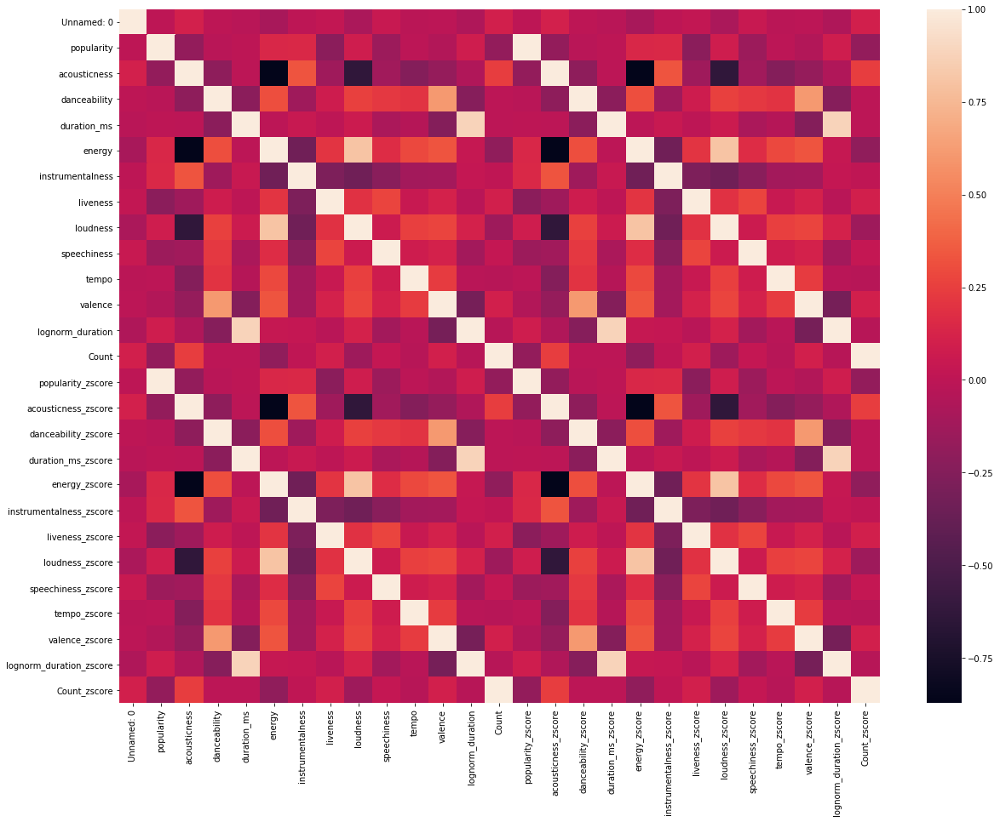

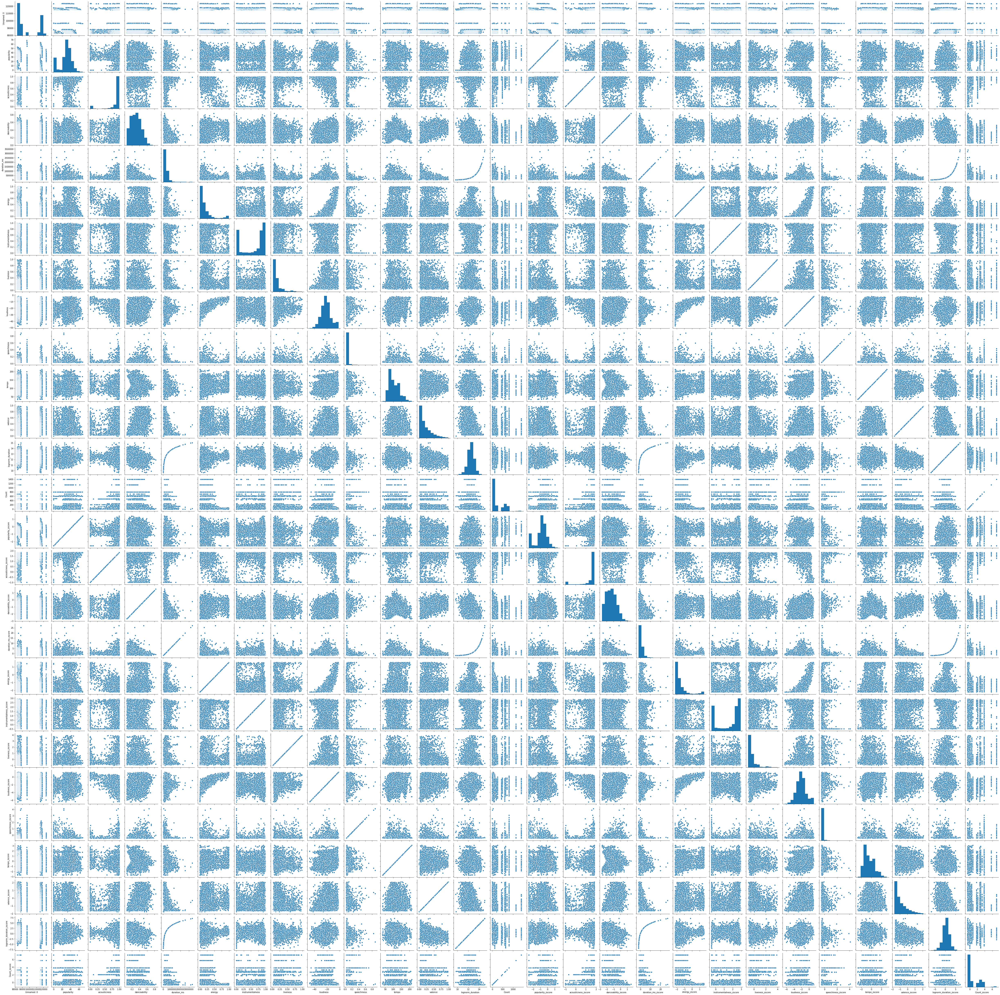

In [7]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(nonpop.corr())
print(m)
n = sns.pairplot(data=nonpop)
print(n)


No classical music is popular, need to investigate unpopular music. 

<ErrorbarContainer object of 3 artists>

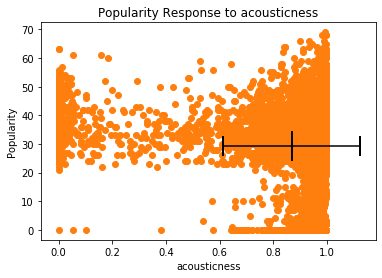

In [13]:
plt.scatter(pop.acousticness, pop.popularity)
plt.scatter(nonpop.acousticness, nonpop.popularity)
plt.xlabel("acousticness")
plt.ylabel("Popularity")
plt.title("Popularity Response to acousticness")

plt.errorbar(np.mean(pop.acousticness),np.mean(pop.popularity),xerr=np.std(pop.acousticness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.acousticness),np.mean(nonpop.popularity),xerr=np.std(nonpop.acousticness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

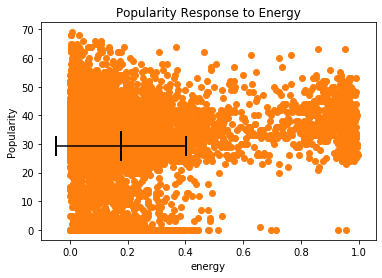

In [14]:
plt.scatter(pop.energy, pop.popularity)
plt.scatter(nonpop.energy, nonpop.popularity)
plt.xlabel("energy")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.energy),np.mean(pop.popularity),xerr=np.std(pop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.energy),np.mean(nonpop.popularity),xerr=np.std(nonpop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

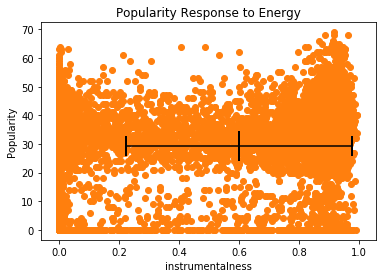

In [10]:
plt.scatter(pop.instrumentalness, pop.popularity)
plt.scatter(nonpop.instrumentalness, nonpop.popularity)
plt.xlabel("instrumentalness")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.instrumentalness),np.mean(pop.popularity),xerr=np.std(pop.instrumentalness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.instrumentalness),np.mean(nonpop.popularity),xerr=np.std(nonpop.instrumentalness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

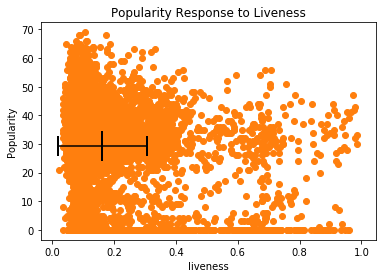

In [16]:
plt.scatter(pop.liveness, pop.popularity)
plt.scatter(nonpop.liveness, nonpop.popularity)
plt.xlabel("liveness")
plt.ylabel("Popularity")
plt.title("Popularity Response to Liveness")

plt.errorbar(np.mean(pop.liveness),np.mean(pop.popularity),xerr=np.std(pop.liveness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.liveness),np.mean(nonpop.popularity),xerr=np.std(nonpop.liveness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

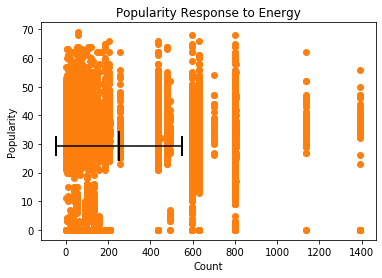

In [17]:
plt.scatter(pop.Count, pop.popularity)
plt.scatter(nonpop.Count, nonpop.popularity)
plt.xlabel("Count")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.Count),np.mean(pop.popularity),xerr=np.std(pop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.Count),np.mean(nonpop.popularity),xerr=np.std(nonpop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:200: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:908: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:200: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:908: RuntimeWar

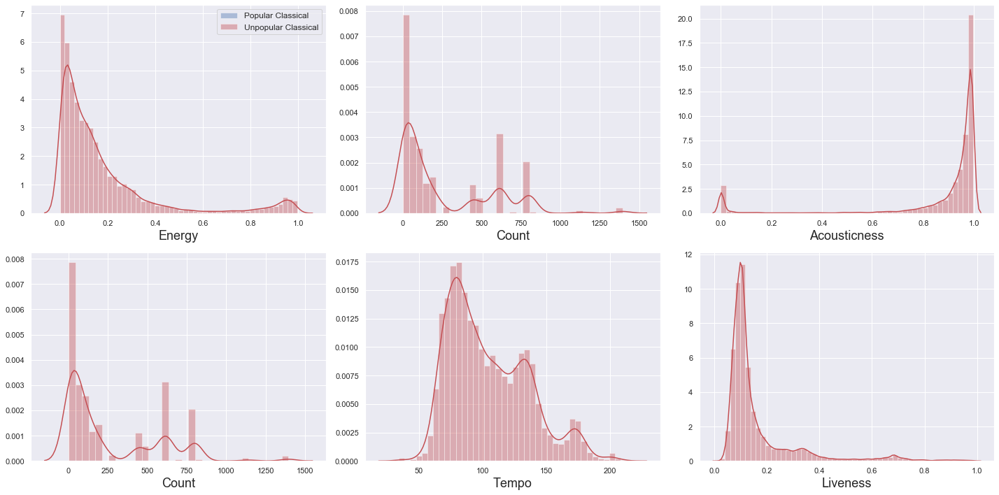

In [25]:
plt.figure(figsize=(20,10))

sns.set()

plt.subplot(231)
sns.distplot(pop.energy, label='Popular Classical')
sns.distplot(nonpop.energy, color='r', label='Unpopular Classical')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.acousticness)
sns.distplot(nonpop.acousticness, color='r')
plt.xlabel('Acousticness', fontsize=18)

plt.subplot(234)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(235)
sns.distplot(pop.tempo)
sns.distplot(nonpop.tempo, color='r')
plt.xlabel('Tempo', fontsize=18)

plt.subplot(236)
sns.distplot(pop.liveness)
sns.distplot(nonpop.liveness, color='r')
plt.xlabel('Liveness', fontsize=18)

plt.tight_layout()
plt.show()


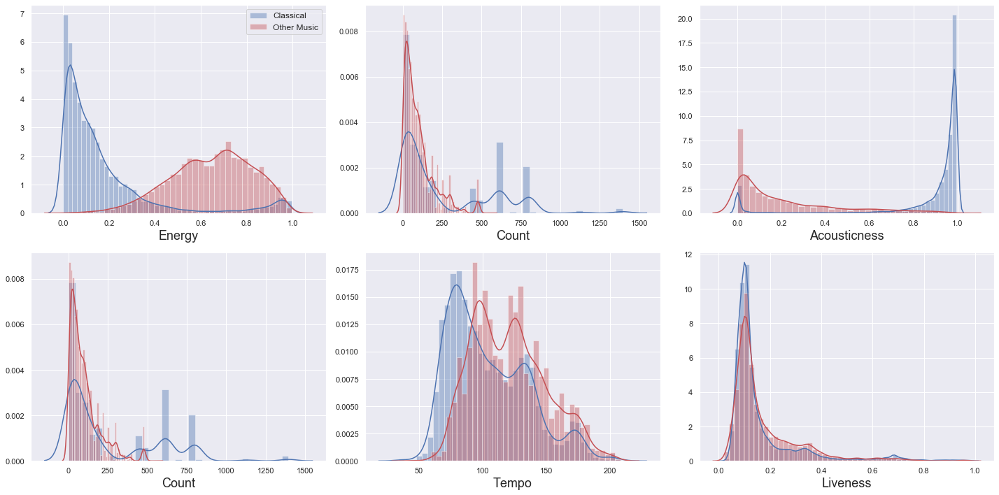

In [26]:
plt.figure(figsize=(20,10))

sns.set()

plt.subplot(231)
sns.distplot(nonpop.energy, label='Classical')
sns.distplot(allpop.energy, color='r', label='Other Music')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(nonpop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(nonpop.acousticness)
sns.distplot(allpop.acousticness, color='r')
plt.xlabel('Acousticness', fontsize=18)

plt.subplot(234)
sns.distplot(nonpop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(235)
sns.distplot(nonpop.tempo)
sns.distplot(allpop.tempo, color='r')
plt.xlabel('Tempo', fontsize=18)

plt.subplot(236)
sns.distplot(nonpop.liveness)
sns.distplot(allpop.liveness, color='r')
plt.xlabel('Liveness', fontsize=18)

plt.tight_layout()
plt.show()


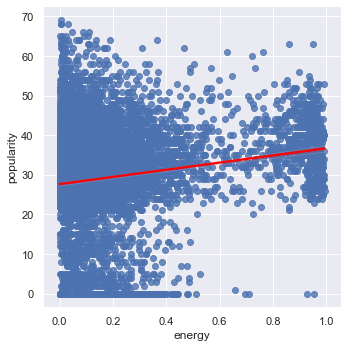

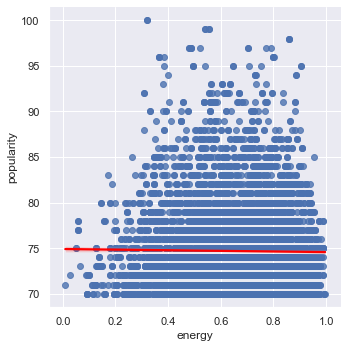

In [21]:
n = sns.lmplot(x='energy',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='energy',y='popularity',data=allpop,line_kws={'color': 'red'})
print(p)


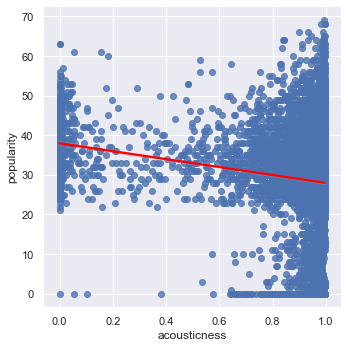

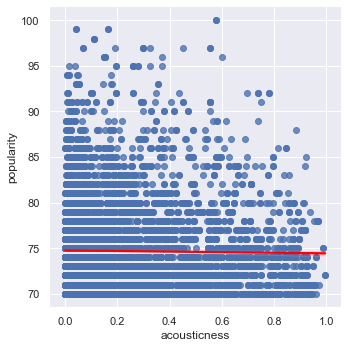

In [22]:
n = sns.lmplot(x='acousticness',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='acousticness',y='popularity',data=allpop,line_kws={'color': 'red'})
print(p)


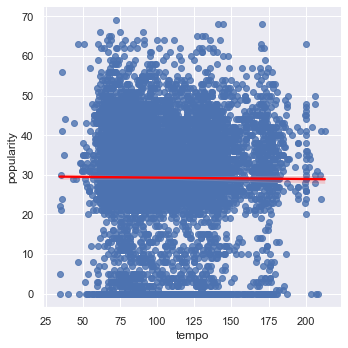

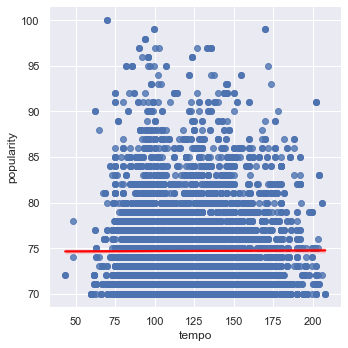

In [23]:
n = sns.lmplot(x='tempo',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='tempo',y='popularity',data=allpop,line_kws={'color': 'red'})
print(p)


From all the information gathered from each notebook, one can see that there are some distinctions for each genre, and for a popular song within that genre. For instance, Rap and Pop have higher danceability, Blues has low danceability, with high energy, and low energy, low temp, and high acosticness. 

With all of this in mind machine elarning techniqueds will be used on the data to see how well one can use this data to predcit if a song will be popular within a given genre. 